# Alone factor

To get an idea of how 'alone' each mutation is, we have to find the alone-factor for each mutation. This can be done by going through each patient, finding how many- and which mutations they have. Then, for each patient, their mutations get a value of 1/#-mutations. After this, we can examine the distribution of alone-factors for each mutation.

## Setup

In [1]:
library('ggplot2')
library('dplyr')
library('RColorBrewer')
library('data.table')
library('ggpubr')

Warning message:
“package ‘ggplot2’ was built under R version 4.2.3”
Warning message:
“package ‘dplyr’ was built under R version 4.2.3”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last


Warning message:
“package ‘ggpubr’ was built under R version 4.2.3”


In [2]:
# Plot dimensions
options(repr.plot.width=10, repr.plot.height=7)

## Get data

In [3]:
# Getting the mutation dataset where duplicates are removed
mutation_data_de_duplicated <- read.csv("../../derived_data/genie_v15/mutation_no_duplicates.csv", header=TRUE, stringsAsFactors=FALSE)

# Removing two columns only containing indexes
mutation_data_de_duplicated <- mutation_data_de_duplicated[,-1:-2]

# Making age an integer
mutation_data_de_duplicated$AGE_AT_SEQ_REPORT[mutation_data_de_duplicated$AGE_AT_SEQ_REPORT=='<18'] <- '17'
mutation_data_de_duplicated$AGE_AT_SEQ_REPORT[mutation_data_de_duplicated$AGE_AT_SEQ_REPORT=='>89'] <- '90'
mutation_data_de_duplicated$AGE_AT_SEQ_REPORT <- as.numeric(mutation_data_de_duplicated$AGE_AT_SEQ_REPORT)

# Define our age-intervals
age_interval_levels <- c('<45',
                         '[45-55[',
                         '[55-65[',
                         '[65-75[',
                         '>=75')

# Applying the age-intervals
mutation_data_de_duplicated$age_interval <- '<45'
mutation_data_de_duplicated$age_interval[mutation_data_de_duplicated$AGE_AT_SEQ_REPORT>=45] <- '[45-55['
mutation_data_de_duplicated$age_interval[mutation_data_de_duplicated$AGE_AT_SEQ_REPORT>=55] <- '[55-65['
mutation_data_de_duplicated$age_interval[mutation_data_de_duplicated$AGE_AT_SEQ_REPORT>=65] <- '[65-75['
mutation_data_de_duplicated$age_interval[mutation_data_de_duplicated$AGE_AT_SEQ_REPORT>=75] <- '>=75'

# Removing female prostata cancer individuals
#mutation_data_de_duplicated[which(mutation_data_de_duplicated$CANCER_TYPE=='Prostate Cancer' & 
#                                 mutation_data_de_duplicated$SEX=='Female'),1]

mutation_data_de_duplicated <- mutation_data_de_duplicated[which(mutation_data_de_duplicated$SAMPLE_ID!='GENIE-DFCI-093107-282203' &
                                 mutation_data_de_duplicated$SAMPLE_ID!='GENIE-UCHI-Patient367-T1'),]

# Checking the data
dim(mutation_data_de_duplicated)
head(mutation_data_de_duplicated)

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


[1] 160956      8

,SAMPLE_ID,AGE_AT_SEQ_REPORT,SEQ_ASSAY_ID,SAMPLE_TYPE,CANCER_TYPE,SEX,length_in_bp,age_interval
,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
1,GENIE-CHOP-C1002819-BS79B4V9EZ,17,CHOP-STNGS,Primary,UNKNOWN,Female,9717318,<45
2,GENIE-CHOP-C1003188-BSHKNH1HNP,17,CHOP-STNGS,Primary,Embryonal Tumor,Female,9717318,<45
3,GENIE-CHOP-C1003434-BSA2BH219E,17,CHOP-STNGS,Metastasis,Glioma,Male,9717318,<45
4,GENIE-CHOP-C1004049-BSYY1EQ16F,17,CHOP-STNGS,Primary,Glioma,Male,9717318,<45
5,GENIE-CHOP-C1012044-BSTA04C03Y,17,CHOP-STNGS,Primary,Glioma,Male,9717318,<45
6,GENIE-CHOP-C1026312-BSVS8NWRB4,17,CHOP-STNGS,Primary,Glioma,Female,9717318,<45


In [4]:
test <- read.csv("../../derived_data/genie_v15/mutation_no_duplicates.csv", header=TRUE, stringsAsFactors=FALSE)
test[which(test$SAMPLE_ID=='GENIE-DFCI-093107-282203' | test$SAMPLE_ID=='GENIE-UCHI-Patient367-T1'),]

,X,PATIENT_ID,SAMPLE_ID,AGE_AT_SEQ_REPORT,SEQ_ASSAY_ID,SAMPLE_TYPE,CANCER_TYPE,SEX,length_in_bp
,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
21384,47233,GENIE-DFCI-093107,GENIE-DFCI-093107-282203,75,DFCI-ONCOPANEL-3,Metastasis,Prostate Cancer,Female,19799625
128819,59427,GENIE-UCHI-Patient367,GENIE-UCHI-Patient367-T1,68,UCHI-ONCOHEME55-V1,Not Applicable or Heme,Prostate Cancer,Female,3289715


In [5]:
# Getting the full mutation dataset
mutation_data <- read.table("../../data/genie_v15/data_mutations_extended.txt", sep="\t", quote="", head=TRUE)

# Checking the data
dim(mutation_data)
head(mutation_data)

[1] 1840311      64

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Consequence,Variant_Classification,⋯,FILTER,Polyphen_Prediction,Polyphen_Score,SIFT_Prediction,SIFT_Score,SWISSPROT,n_depth,t_depth,Annotation_Status,mutationInCis_Flag
,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<dbl>,<chr>,<dbl>,<lgl>,<int>,<int>,<chr>,<chr>
1,KRAS,3845,JHU,GRCh37,12,25398285,25398285,+,missense_variant,Missense_Mutation,⋯,PASS,probably_damaging,0.991,deleterious,0.04,NA,NA,1623,SUCCESS,False
2,BRAF,673,JHU,GRCh37,7,140453136,140453136,+,missense_variant,Missense_Mutation,⋯,PASS,probably_damaging,0.963,deleterious,0.00,NA,NA,1031,SUCCESS,False
3,EGFR,1956,JHU,GRCh37,7,55249071,55249071,+,missense_variant,Missense_Mutation,⋯,PASS,probably_damaging,1.000,deleterious,0.00,NA,NA,692,SUCCESS,False
4,TP53,7157,JHU,GRCh37,17,7577120,7577120,+,missense_variant,Missense_Mutation,⋯,PASS,possibly_damaging,0.643,tolerated,0.13,NA,NA,930,SUCCESS,False
5,NRAS,4893,JHU,GRCh37,1,115256529,115256529,+,missense_variant,Missense_Mutation,⋯,PASS,benign,0.251,tolerated,0.06,NA,NA,2277,SUCCESS,False
6,PIK3CA,5290,JHU,GRCh37,3,178952085,178952085,+,missense_variant,Missense_Mutation,⋯,PASS,benign,0.085,tolerated,0.11,NA,NA,1064,SUCCESS,False


In [6]:
# Getting sample data
sample_data <- read.table("../../data/genie_v15/data_clinical_sample.txt", sep="\t", quote="", head=TRUE)

# Making age an integer
sample_data$AGE_AT_SEQ_REPORT[sample_data$AGE_AT_SEQ_REPORT=='<18'] <- '17'
sample_data$AGE_AT_SEQ_REPORT[sample_data$AGE_AT_SEQ_REPORT=='>89'] <- '90'
sample_data$AGE_AT_SEQ_REPORT <- as.numeric(sample_data$AGE_AT_SEQ_REPORT)

# Define our age-intervals
age_interval_levels <- c('<45',
                         '[45-55[',
                         '[55-65[',
                         '[65-75[',
                         '>=75')

# Applying the age-intervals
sample_data$age_interval <- '<45'
sample_data$age_interval[sample_data$AGE_AT_SEQ_REPORT>=45] <- '[45-55['
sample_data$age_interval[sample_data$AGE_AT_SEQ_REPORT>=55] <- '[55-65['
sample_data$age_interval[sample_data$AGE_AT_SEQ_REPORT>=65] <- '[65-75['
sample_data$age_interval[sample_data$AGE_AT_SEQ_REPORT>=75] <- '>=75'

# Chekcing the result
dim(sample_data)
head(sample_data)

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”


[1] 198041     10

,PATIENT_ID,SAMPLE_ID,AGE_AT_SEQ_REPORT,ONCOTREE_CODE,SAMPLE_TYPE,SEQ_ASSAY_ID,CANCER_TYPE,CANCER_TYPE_DETAILED,SAMPLE_TYPE_DETAILED,age_interval
,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,GENIE-VICC-101416,GENIE-VICC-101416-unk-1,52,MAAP,Primary,VICC-01-T7,Appendiceal Cancer,Mucinous Adenocarcinoma of the Appendix,Primary tumor,[45-55[
2,GENIE-VICC-102225,GENIE-VICC-102225-unk-1,31,READ,Metastasis,VICC-01-T7,Colorectal Cancer,Rectal Adenocarcinoma,Metastasis site unspecified,<45
3,GENIE-VICC-102424,GENIE-VICC-102424-unk-1,63,SCCNOS,Metastasis,VICC-01-T7,Cancer of Unknown Primary,"Squamous Cell Carcinoma, NOS",Metastasis site unspecified,[55-65[
4,GENIE-VICC-102966,GENIE-VICC-102966-unk-1,64,LUAD,Metastasis,VICC-01-T7,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,Metastasis site unspecified,[55-65[
5,GENIE-VICC-103244,GENIE-VICC-103244-unk-1,50,IDC,Primary,VICC-01-T5A,Breast Cancer,Breast Invasive Ductal Carcinoma,Primary tumor,[45-55[
6,GENIE-VICC-103477,GENIE-VICC-103477-unk-1,40,MRLS,Primary,VICC-01-D2,Soft Tissue Sarcoma,Myxoid/Round-Cell Liposarcoma,Primary tumor,<45


In [7]:
panel_length <- read.csv("../../derived_data/genie_v15/panel_length_table.csv", header=TRUE, stringsAsFactors=FALSE)

panel_length <- panel_length[,-1]

dim(panel_length)
head(panel_length)

[1] 112   2

,Assay_ID,length_in_bp
,<chr>,<int>
1,UHN-48-V1,529200
2,UHN-50-V2,308378
3,GRCC-CHP2,330405
4,GRCC-CP1,332685
5,GRCC-MOSC3,2276205
6,NKI-TSACP-MISEQ-NGS,567000


## General Alone-factor

In [8]:
sample_data <- rename(sample_data, Assay_ID = SEQ_ASSAY_ID)
sample_data <- rename(sample_data, Tumor_Sample_Barcode = SAMPLE_ID)

In [9]:
# Create an empty data-table which will hold the chi-squared gof results
general_alone_factor <- data.frame(matrix(ncol = 5, nrow = 0))
# We name the columns
colnames(general_alone_factor) <- c('age_interval', 'sex', 'sample_type', 'Hugo_Symbol', 'alone_factor')

# Looping through each cancer-type
for (age in age_interval_levels){
    for (sex in c('Male','Female')){
        for (sample_type in c('Primary', 'Metastasis')){
            
            # Limiting our search to the ones tat fit our group
            de_duplicated <- mutation_data_de_duplicated[which(mutation_data_de_duplicated$age_interval==age &
                                                                      mutation_data_de_duplicated$SEX==sex &
                                                                      mutation_data_de_duplicated$SAMPLE_TYPE==sample_type),]
            
            # Creating a vector containing all the samples we want to keep, the ones without duplicates
            keep <- unique(de_duplicated$SAMPLE_ID)
            
            # Creating a new table containing mutation data for the samples we want to keep
            my_table <- mutation_data[which(mutation_data$Tumor_Sample_Barcode %in% keep),]

            # Doing an inner-join so we only keep data where the patient-ID is known
            g_sample_data <- inner_join(sample_data, panel_length, join_by(Assay_ID))

            # Doing an inner-join so we only keep data where the patient-ID is known
            my_table <- inner_join(my_table, g_sample_data, join_by(Tumor_Sample_Barcode))

            # Selecting only a subset of the columns we need
            my_table <- my_table %>% select(Hugo_Symbol, Assay_ID, PATIENT_ID, length_in_bp)

            # Creating a new data-table containing a count of how often each patient occurs in the dataset
            # This is the equivalent of how many mutations that patient has
            count <- as.data.frame(table(my_table$PATIENT_ID))
                
            if (nrow(count) > 0){
                # Renaming the columns in count
                count <- rename(count, PATIENT_ID = Var1)
                count <- rename(count, count = Freq)

                # Then doing an inner-join to add count to my_table
                my_table <- inner_join(my_table, count, join_by(PATIENT_ID))

                # Creating the alone-factor column based on count
                my_table$alone_factor <- 1/my_table$count

                # Adding age column
                my_table$age_interval <- age

                # Adding sex column
                my_table$sex <- sex

                # Adding sample_type column
                my_table$sample_type <- sample_type

                # Selecting columns of interest
                my_table <- my_table %>% select('age_interval', 'sex', 'sample_type', 'Hugo_Symbol', 'alone_factor')

                # Adding results to the final table
                general_alone_factor <- rbind(general_alone_factor, my_table)                    
            }
        }
    }
}

head(general_alone_factor)
dim(general_alone_factor)

,age_interval,sex,sample_type,Hugo_Symbol,alone_factor
,<chr>,<chr>,<chr>,<chr>,<dbl>
1,<45,Male,Primary,BRAF,0.3333333
2,<45,Male,Primary,FBXW7,0.3333333
3,<45,Male,Primary,NOTCH1,0.3333333
4,<45,Male,Primary,TP53,0.3333333
5,<45,Male,Primary,FGFR3,0.3333333
6,<45,Male,Primary,APC,0.3333333


[1] 1292133       5

In [10]:
# Wrangling
general_alone_factor <- na.omit(general_alone_factor)

general_alone_factor$group <- 'Female-Primary'
general_alone_factor$group[general_alone_factor$sex=='Male' & general_alone_factor$sample_type=='Primary'] <- 'Male-Primary'
general_alone_factor$group[general_alone_factor$sex=='Female' & general_alone_factor$sample_type=='Metastasis'] <- 'Female-Metastasis'
general_alone_factor$group[general_alone_factor$sex=='Male' & general_alone_factor$sample_type=='Metastasis'] <- 'Male-Metastasis'

general_alone_factor$group <- factor(general_alone_factor$group, levels=c('Female-Primary', 'Male-Primary', 'Female-Metastasis', 'Male-Metastasis'))

table(general_alone_factor$group)

general_alone_factor$age_interval <- factor(general_alone_factor$age_interval, levels=age_interval_levels)


   Female-Primary      Male-Primary Female-Metastasis   Male-Metastasis 
           487535            372920            233218            198460 

`summarise()` has grouped output by 'age_interval', 'group'. You can override using the `.groups` argument.
Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_point()`).”


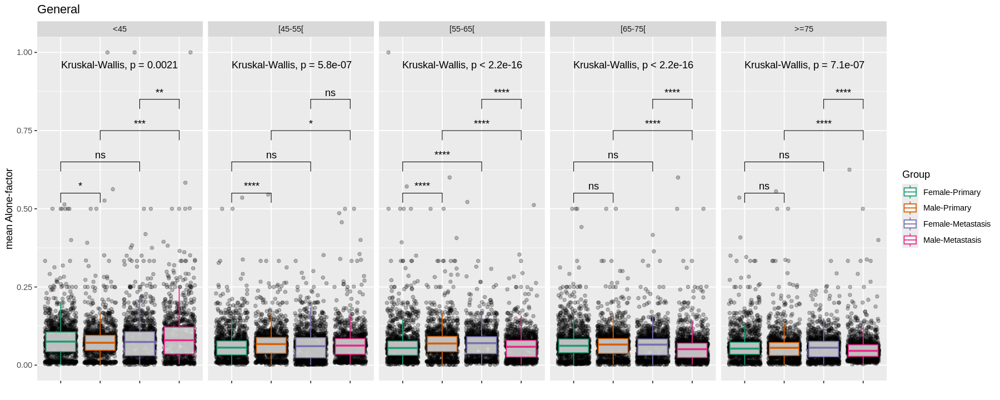

In [12]:
# Plotting the result
options(repr.plot.width=15, repr.plot.height=6)

# Mean point scatter + boxplot
g_mean <- general_alone_factor %>% group_by(age_interval, group, Hugo_Symbol) %>% summarize(m = mean(alone_factor))

#g_uncer_50 <- g_mean[which(g_mean$m < 0.5),]
#g_above_50 <- g_mean[which(g_mean$m >= 0.5),]

my_comparisons <- list( c("Female-Primary", "Male-Primary"), c("Female-Primary", "Female-Metastasis"), c("Male-Primary", "Male-Metastasis"), c("Male-Metastasis", "Female-Metastasis"))

ggplot(g_mean, aes(x = group, y = m)) +
geom_jitter(alpha=0.25) +
geom_boxplot(alpha=0.75, outlier.shape=NA, aes(group=group, colour=group)) +
stat_compare_means(comparisons = my_comparisons, label.y = c(0.5, 0.6, 0.7, 0.8), aes(label = after_stat(p.signif))) +
stat_compare_means(label.y = 0.95, label.x=1.6) +
scale_color_brewer(palette = "Dark2") +
labs(title = 'General') +
facet_wrap(~age_interval, nrow=1) +
ylim(0, 1) +
xlab('') +
ylab('mean Alone-factor') +
labs(colour='Group') +
theme(axis.text.x=element_blank())

# Note: list(cutpoints = c(0, 0.0001, 0.001, 0.01, 0.05, Inf), symbols = c("****", "***", "**", "*", "ns"))

Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_point()`).”


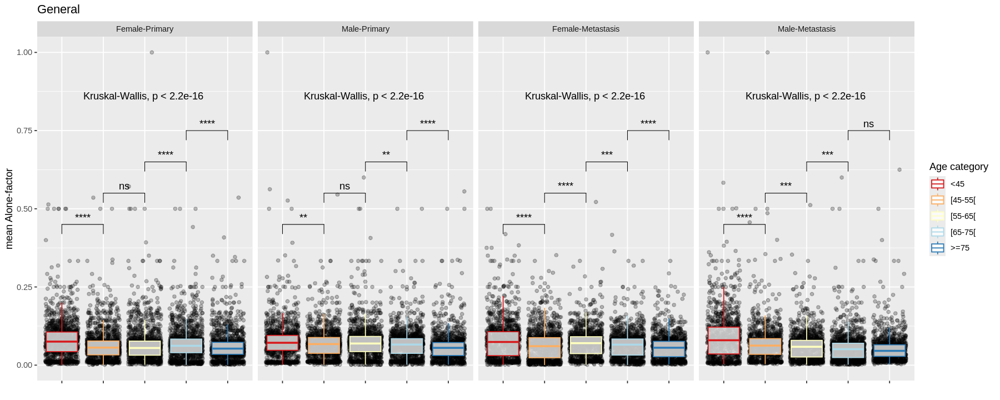

In [12]:
my_comparisons <- list( c("<45", "[45-55["), c("[45-55[", "[55-65["), c("[55-65[", "[65-75["), c("[65-75[", ">=75"))

ggplot(g_mean, aes(x = age_interval, y = m)) +
geom_jitter(alpha=0.25) +
geom_boxplot(alpha=0.75, outlier.shape=NA, aes(group=age_interval, colour=age_interval)) +
stat_compare_means(comparisons = my_comparisons, label.y = c(0.4, 0.5, 0.6, 0.7, 0.8), aes(label = after_stat(p.signif))) +
stat_compare_means(label.y = 0.85, label.x=2.1) +
scale_color_brewer(palette = "RdYlBu") +
labs(title = 'General') +
facet_wrap(~group, nrow=1) +
ylim(0, 1) +
xlab('') +
ylab('mean Alone-factor') +
labs(colour='Age category') +
theme(axis.text.x=element_blank())

In [13]:
fwrite(general_alone_factor, "../../derived_data/genie_v15/g_alone_factor.csv")
fwrite(g_mean, "../../derived_data/genie_v15/g_alone_factor_mean.csv")

## Cancer-specific Alone-factor

In [14]:
cancer_of_interest <- c('Bladder Cancer',
                        'Breast Cancer',
                        'Colorectal Cancer',
                        'Endometrial Cancer',
                        'Esophagogastric Cancer',
                        'Glioma',
                        'Head and Neck Cancer',
                        'Hepatobiliary Cancer',
                        'Melanoma',
                        'Non-Small Cell Lung Cancer',
                        'Ovarian Cancer',
                        'Pancreatic Cancer',
                        'Prostate Cancer',
                        'Renal Cell Carcinoma',
                        'Soft Tissue Sarcoma',
                        'Thyroid Cancer')

In [15]:
# Create an empty data-table which will hold the chi-squared gof results
cancer_specific_alone_factor <- data.frame(matrix(ncol = 6, nrow = 0))
# We name the columns
colnames(cancer_specific_alone_factor) <- c('cancer_type', 'age_interval', 'sex', 'sample_type', 'Hugo_Symbol', 'alone_factor')

# Looping through each cancer-type
for (cancer in cancer_of_interest){
    for (age in age_interval_levels){
        for (sex in c('Male','Female')){
            for (sample_type in c('Primary', 'Metastasis')){
                
                # Limiting our search to the ones tat fit our cancer
                de_duplicated_cancer <- mutation_data_de_duplicated[which(mutation_data_de_duplicated$CANCER_TYPE==cancer &
                                                                         mutation_data_de_duplicated$age_interval==age &
                                                                         mutation_data_de_duplicated$SEX==sex &
                                                                         mutation_data_de_duplicated$SAMPLE_TYPE==sample_type),]

                # Creating a vector containing all the samples we want to keep, the ones without duplicates
                keep <- unique(de_duplicated_cancer$SAMPLE_ID)

                # Creating a new table containing mutation data for the samples we want to keep
                my_table <- mutation_data[which(mutation_data$Tumor_Sample_Barcode %in% keep),]

                # Doing an inner-join so we only keep data where the patient-ID is known
                cancer_sample_data <- inner_join(sample_data, panel_length, join_by(Assay_ID))

                # Doing an inner-join so we only keep data where the patient-ID is known
                my_table <- inner_join(my_table, cancer_sample_data, join_by(Tumor_Sample_Barcode))

                # Selecting only a subset of the columns we need
                my_table <- my_table %>% select(Hugo_Symbol, Assay_ID, PATIENT_ID, length_in_bp)

                # Creating a new data-table containing a count of how often each patient occurs in the dataset
                # This is the equivalent of how many mutations that patient has
                count <- as.data.frame(table(my_table$PATIENT_ID))
                
                if (nrow(count) > 0){
                    # Renaming the columns in count
                    count <- rename(count, PATIENT_ID = Var1)
                    count <- rename(count, count = Freq)

                    # Then doing an inner-join to add count to my_table
                    my_table <- inner_join(my_table, count, join_by(PATIENT_ID))

                    # Creating the alone-factor column based on count
                    my_table$alone_factor <- 1/my_table$count

                    # Adding the cancer column
                    my_table$cancer_type <- cancer

                    # Adding age column
                    my_table$age_interval <- age

                    # Adding sex column
                    my_table$sex <- sex

                    # Adding sample_type column
                    my_table$sample_type <- sample_type

                    # Selecting columns of interest
                    my_table <- my_table %>% select('cancer_type', 'age_interval', 'sex', 'sample_type', 'Hugo_Symbol', 'alone_factor')

                    # Adding results to the final table
                    cancer_specific_alone_factor <- rbind(cancer_specific_alone_factor, my_table)                    
                }
            }
        }
    }
}

head(cancer_specific_alone_factor)
dim(cancer_specific_alone_factor)

,cancer_type,age_interval,sex,sample_type,Hugo_Symbol,alone_factor
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,Bladder Cancer,<45,Male,Primary,ZNF708,0.20000000
2,Bladder Cancer,<45,Male,Primary,FKBP9,0.20000000
3,Bladder Cancer,<45,Male,Primary,MFSD3,0.20000000
4,Bladder Cancer,<45,Male,Primary,ATRX,0.20000000
5,Bladder Cancer,<45,Male,Primary,TET2,0.20000000
6,Bladder Cancer,<45,Male,Primary,BRCA1,0.09090909


[1] 1104470       6

In [16]:
cancer_specific_alone_factor$group <- 'Female-Primary'
cancer_specific_alone_factor$group[cancer_specific_alone_factor$sex=='Male' & cancer_specific_alone_factor$sample_type=='Primary'] <- 'Male-Primary'
cancer_specific_alone_factor$group[cancer_specific_alone_factor$sex=='Female' & cancer_specific_alone_factor$sample_type=='Metastasis'] <- 'Female-Metastasis'
cancer_specific_alone_factor$group[cancer_specific_alone_factor$sex=='Male' & cancer_specific_alone_factor$sample_type=='Metastasis'] <- 'Male-Metastasis'

cancer_specific_alone_factor$group <- factor(cancer_specific_alone_factor$group, levels=c('Female-Primary', 'Male-Primary', 'Female-Metastasis', 'Male-Metastasis'))

cancer_specific_alone_factor$age_interval <- factor(cancer_specific_alone_factor$age_interval, levels=age_interval_levels)

## Plots

In [17]:
# Creating a new data-frame with the mutations with an alone-factor of 1
single <- cancer_specific_alone_factor[which(cancer_specific_alone_factor$alone_factor==1),]

# Counting how many often the different mutations occur int he table
single <- as.data.frame(table(single$Hugo_Symbol))

# Sorting the table by the frequency
single <- single[order(-single$Freq), ]

# Seeing the 10 most frequenct mutations with an alone-factor of 1
single[1:10,]

,Var1,Freq
,<fct>,<int>
510,TP53,3268
266,KRAS,1366
50,BRAF,942
370,PIK3CA,584
123,EGFR,440
338,NRAS,362
401,PTEN,192
99,CTNNB1,158
227,IDH1,152


In [18]:
unique(cancer_specific_alone_factor$cancer_type)

[1] "Bladder Cancer"             "Breast Cancer"             
 [3] "Colorectal Cancer"          "Endometrial Cancer"        
 [5] "Esophagogastric Cancer"     "Glioma"                    
 [7] "Head and Neck Cancer"       "Hepatobiliary Cancer"      
 [9] "Melanoma"                   "Non-Small Cell Lung Cancer"
[11] "Ovarian Cancer"             "Pancreatic Cancer"         
[13] "Prostate Cancer"            "Renal Cell Carcinoma"      
[15] "Soft Tissue Sarcoma"        "Thyroid Cancer"

Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_point()`).”


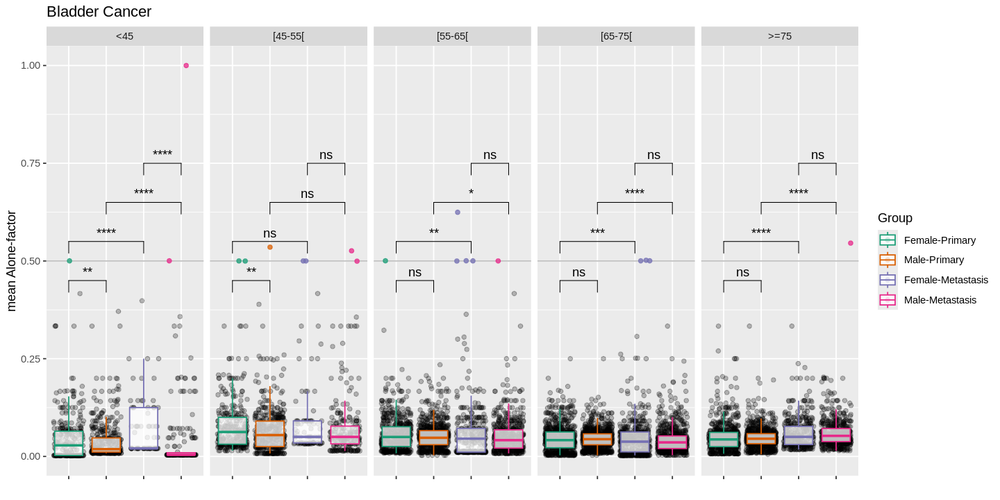

Warning message in wilcox.test.default(c(1, 0.166666666666667, 0.2, 0.333333333333333, :
“cannot compute exact p-value with ties”
Warning message:
“Removed 9 rows containing missing values or values outside the scale range (`geom_point()`).”


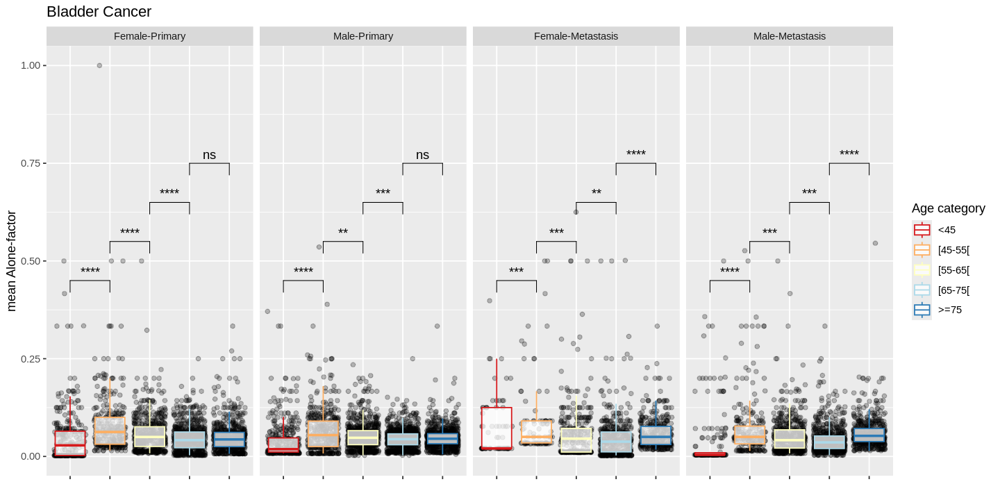

Warning message in wilcox.test.default(c(1, 0.166666666666667, 0.2, 0.333333333333333, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(c(0.111111111111111, 0.111111111111111, 0.111111111111111, :
“cannot compute exact p-value with ties”
Warning message:
“Removed 6 rows containing missing values or values outside the scale range (`geom_point()`).”


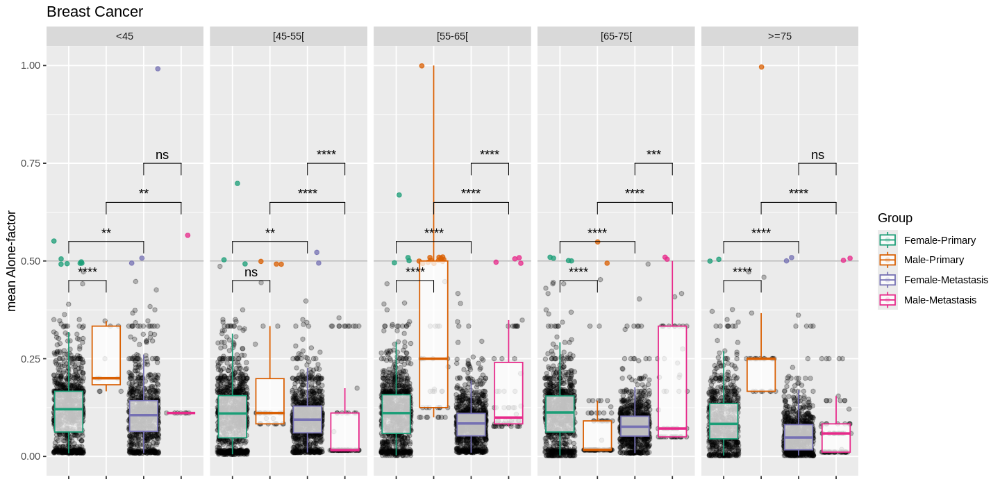

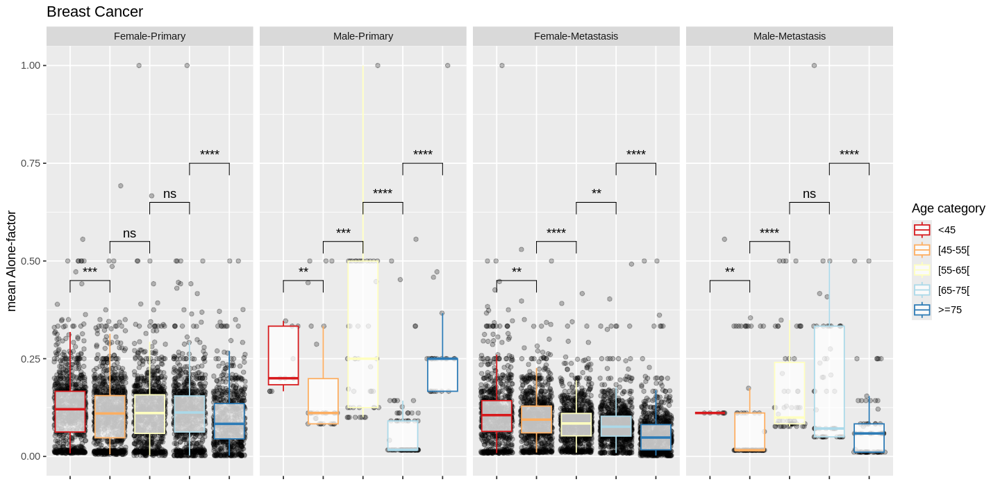

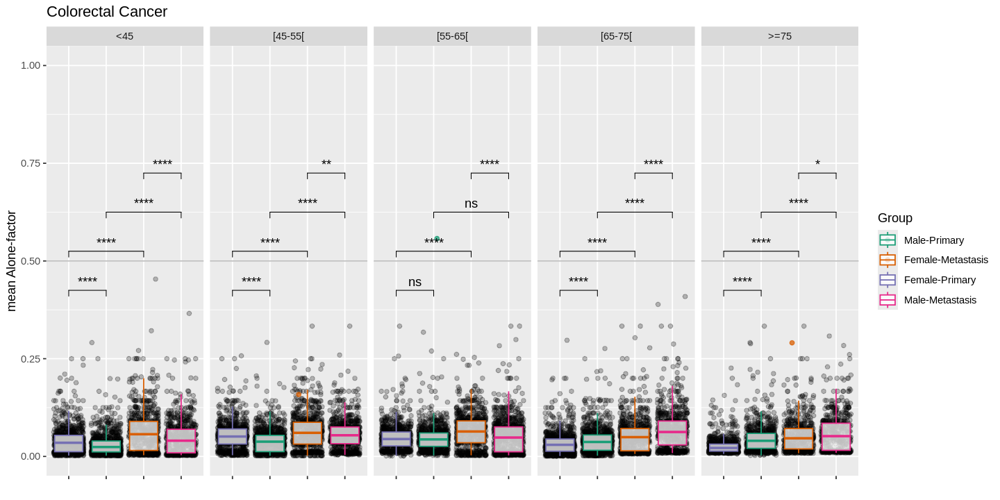

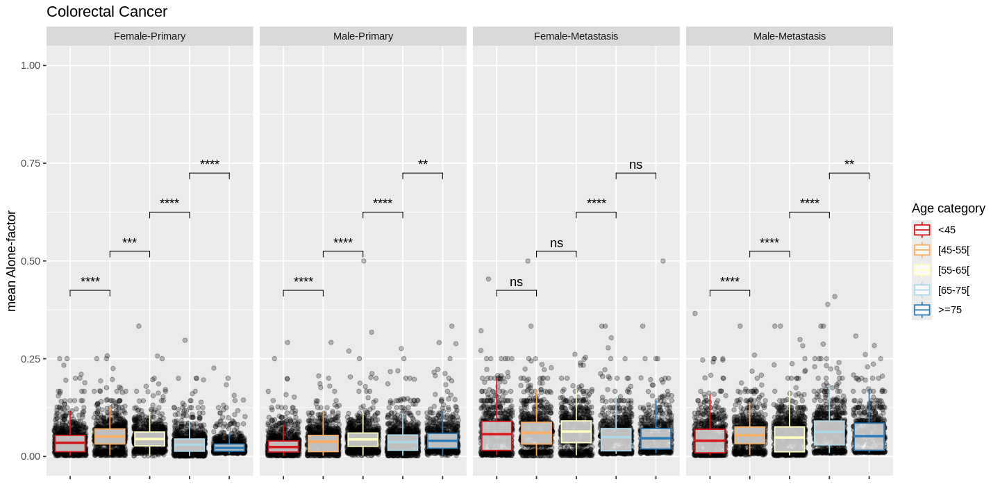

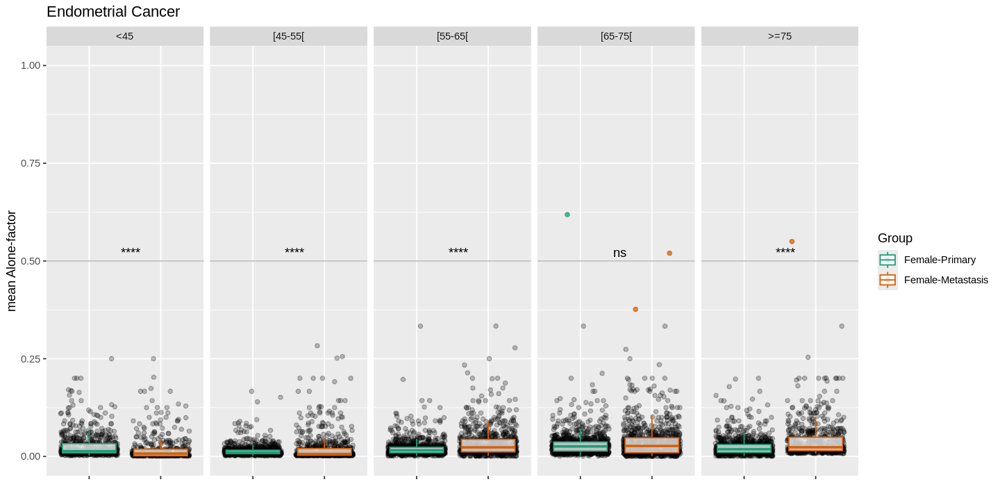

Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_point()`).”


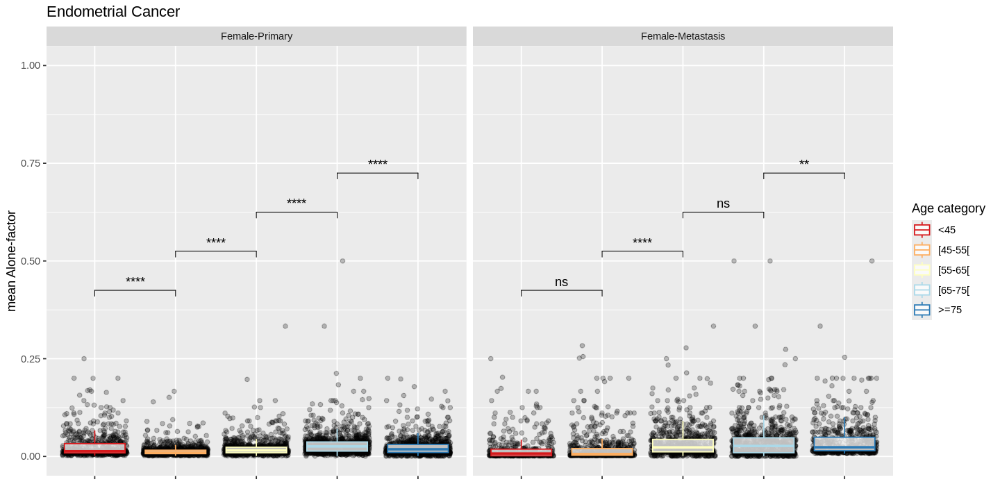

Warning message:
“Removed 6 rows containing missing values or values outside the scale range (`geom_point()`).”


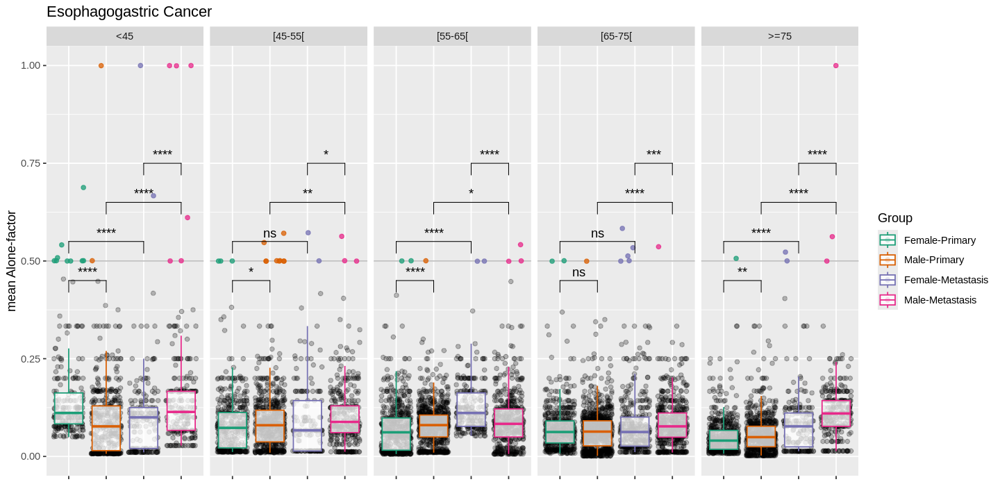

Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_point()`).”


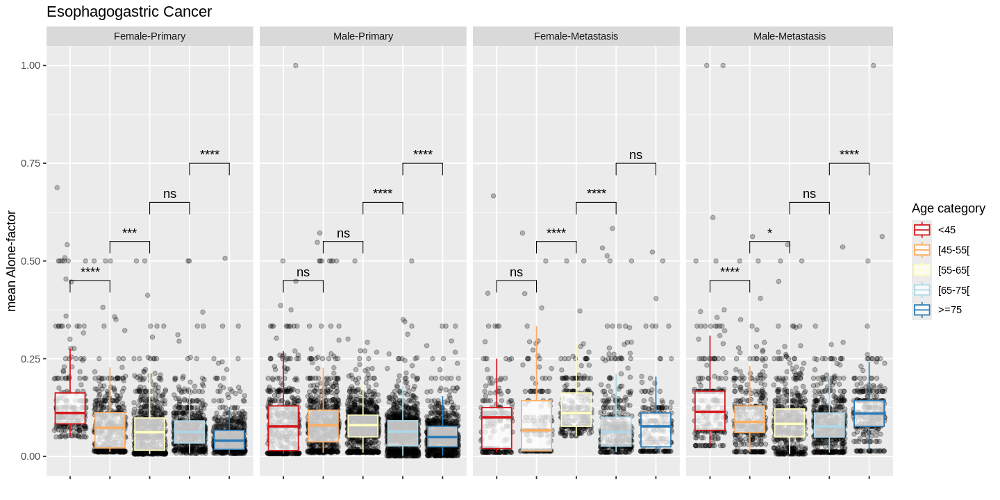

Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_point()`).”


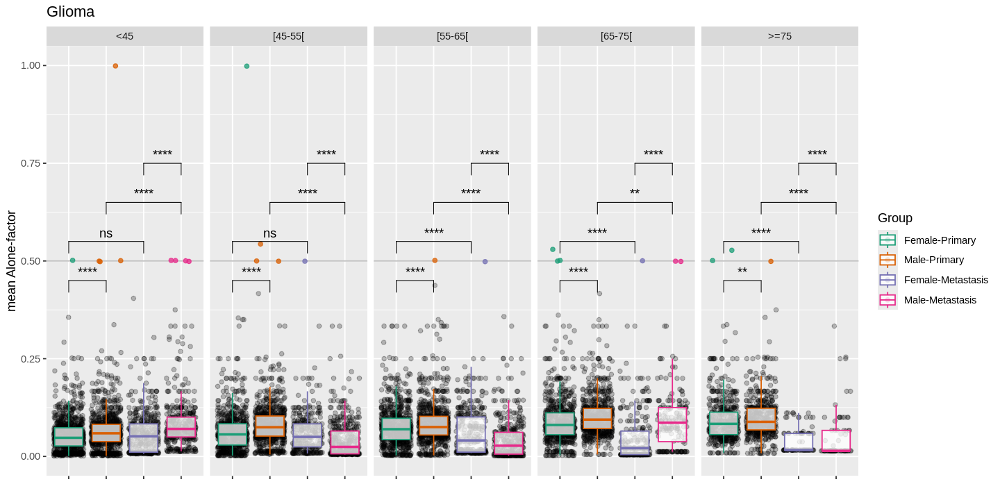

Warning message:
“Removed 15 rows containing missing values or values outside the scale range (`geom_point()`).”


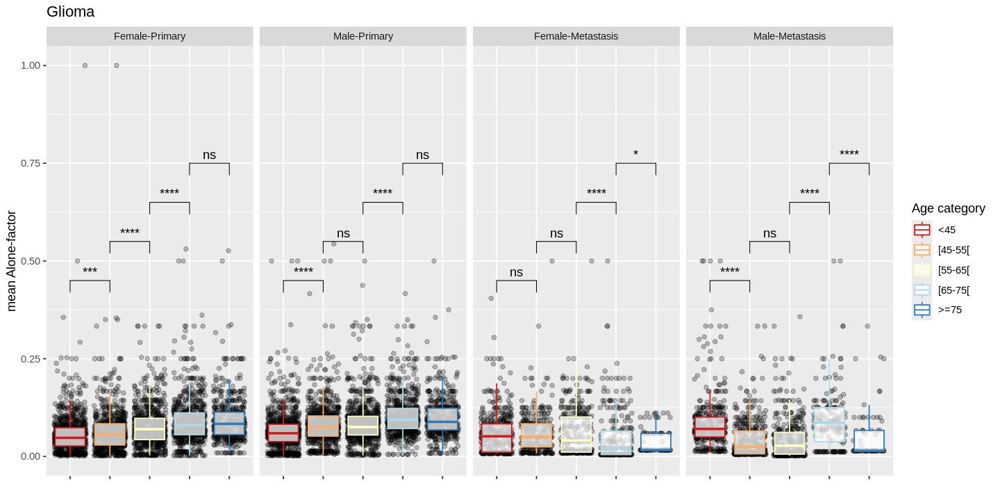

Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_point()`).”


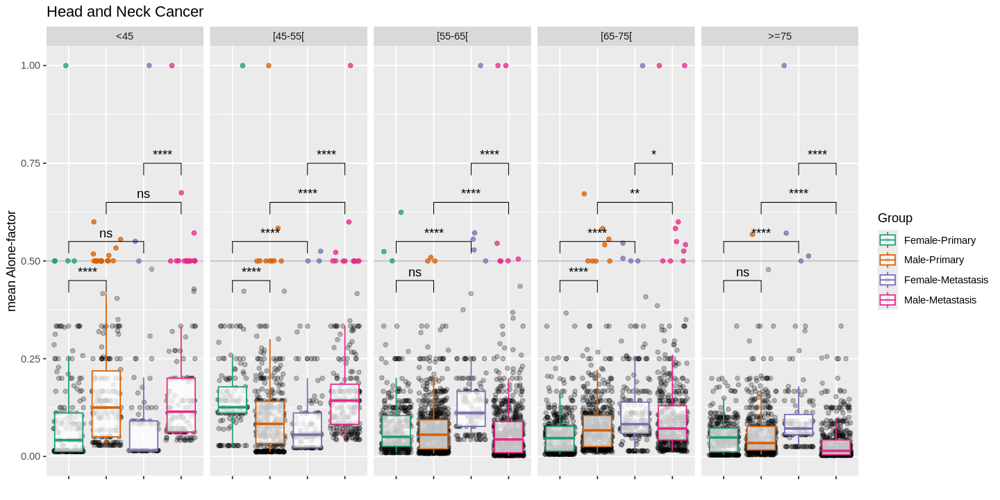

Warning message:
“Removed 10 rows containing missing values or values outside the scale range (`geom_point()`).”


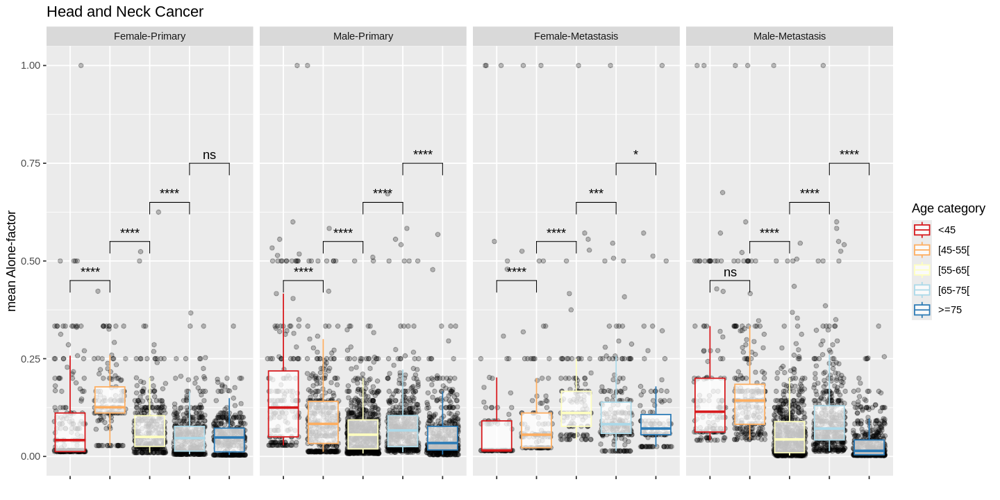

Warning message:
“Removed 14 rows containing missing values or values outside the scale range (`geom_point()`).”


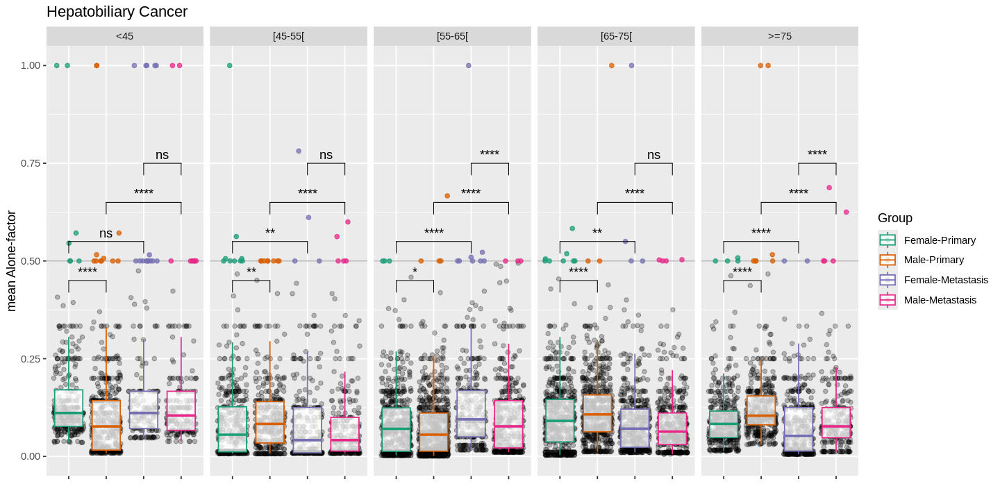

Warning message:
“Removed 2 rows containing missing values or values outside the scale range (`geom_point()`).”


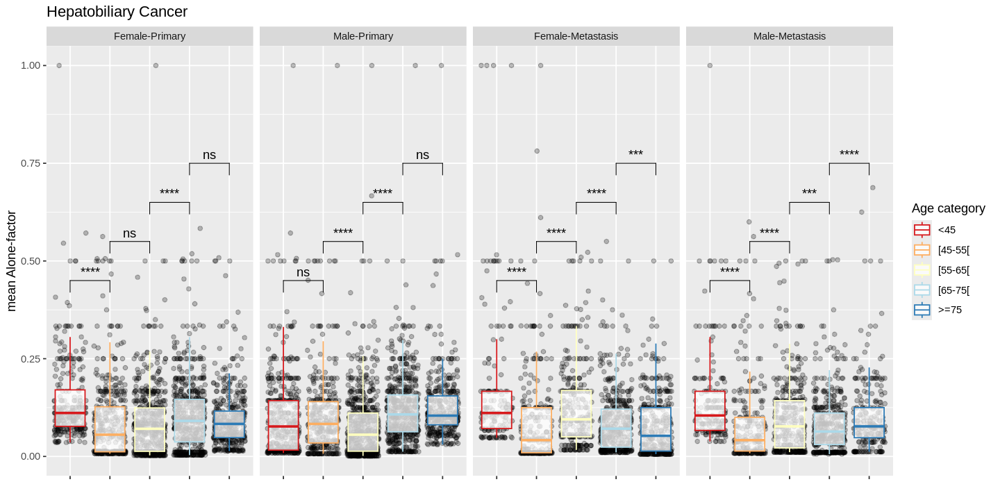

Warning message:
“Removed 2 rows containing missing values or values outside the scale range (`geom_point()`).”


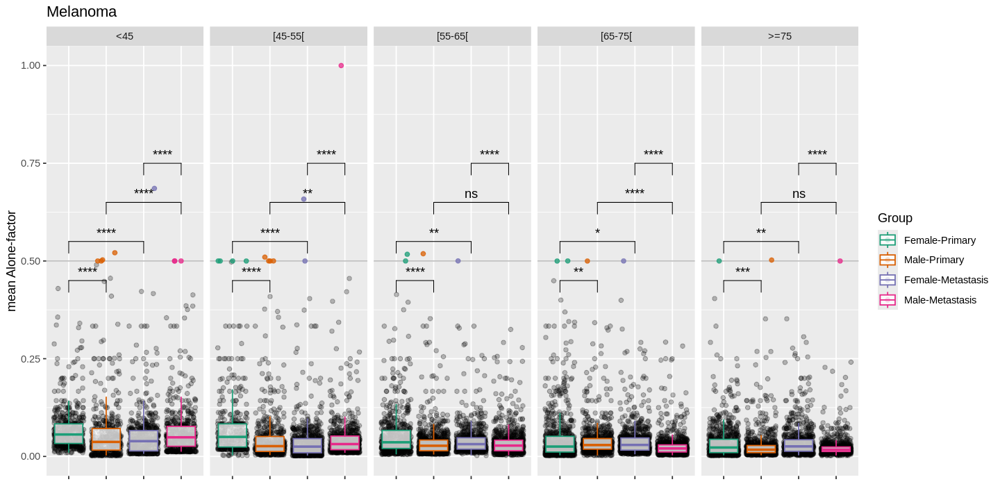

Warning message:
“Removed 9 rows containing missing values or values outside the scale range (`geom_point()`).”


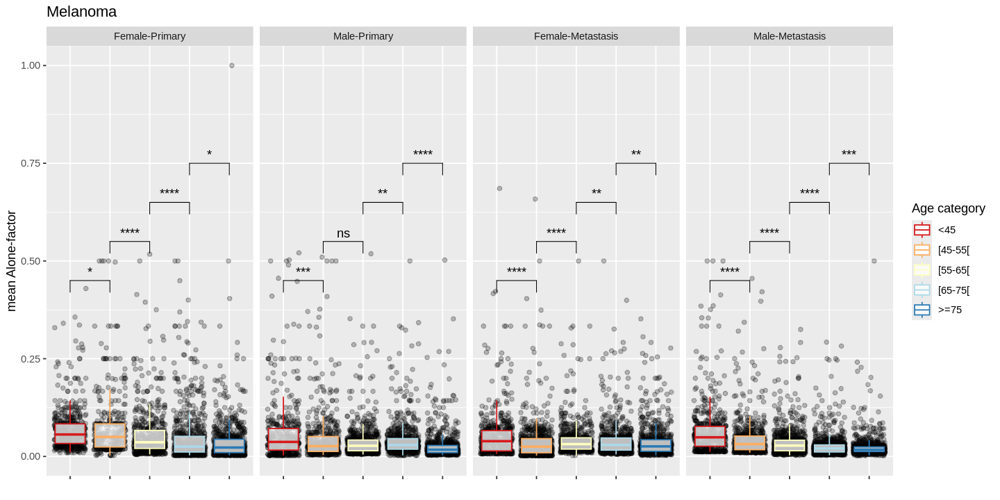

Warning message:
“Removed 6 rows containing missing values or values outside the scale range (`geom_point()`).”


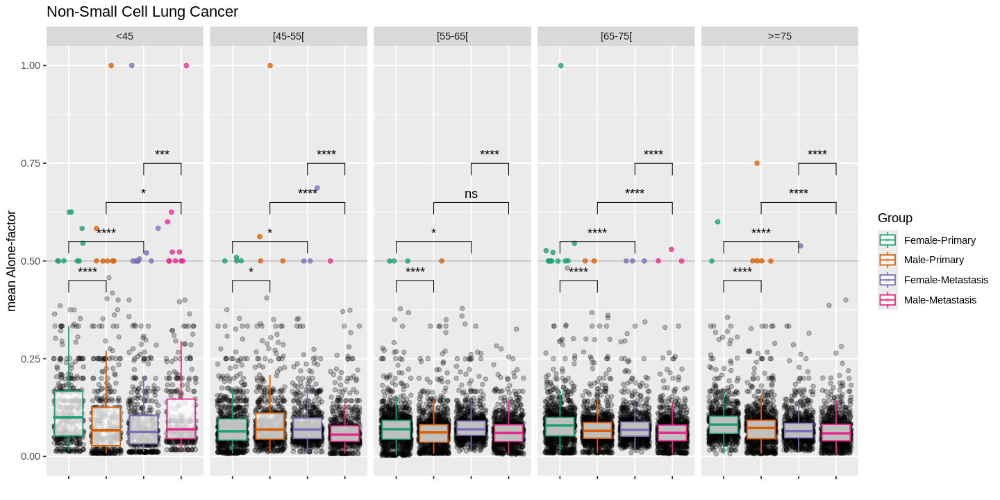

Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_point()`).”


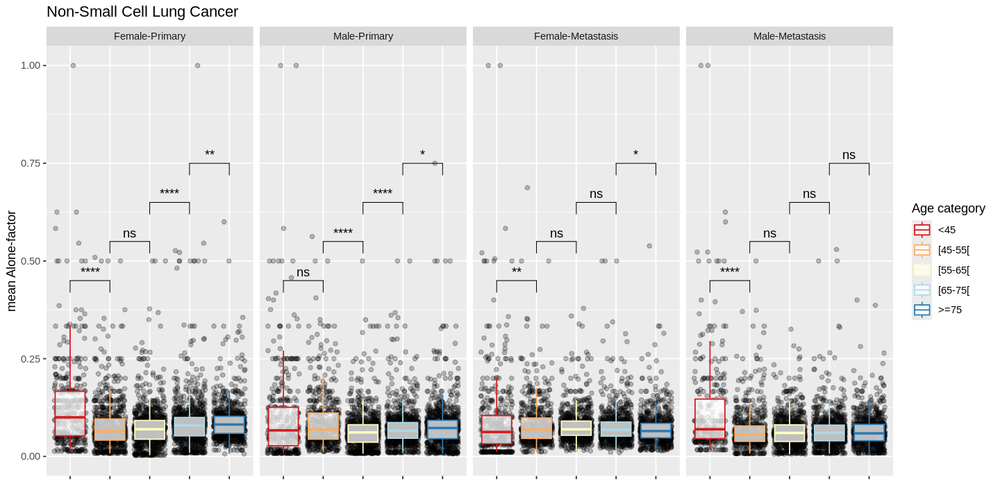

Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_point()`).”


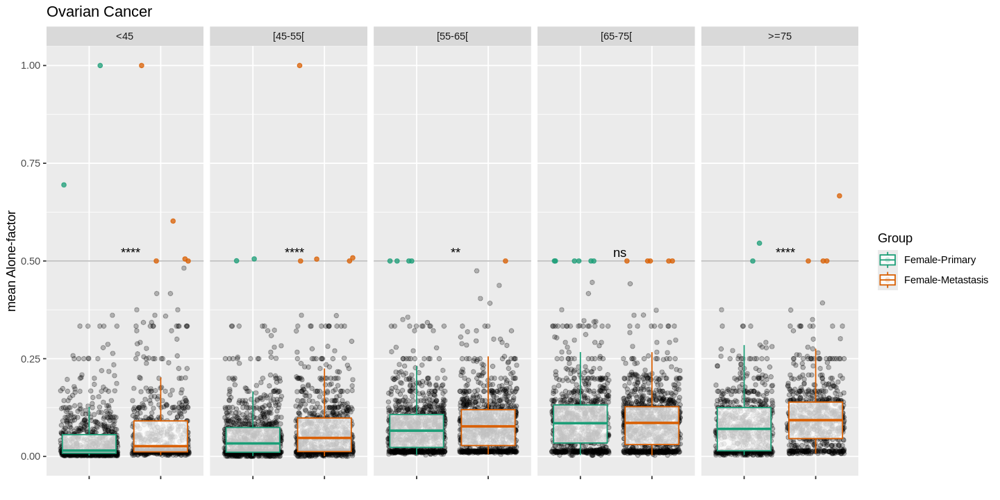

Warning message:
“Removed 15 rows containing missing values or values outside the scale range (`geom_point()`).”


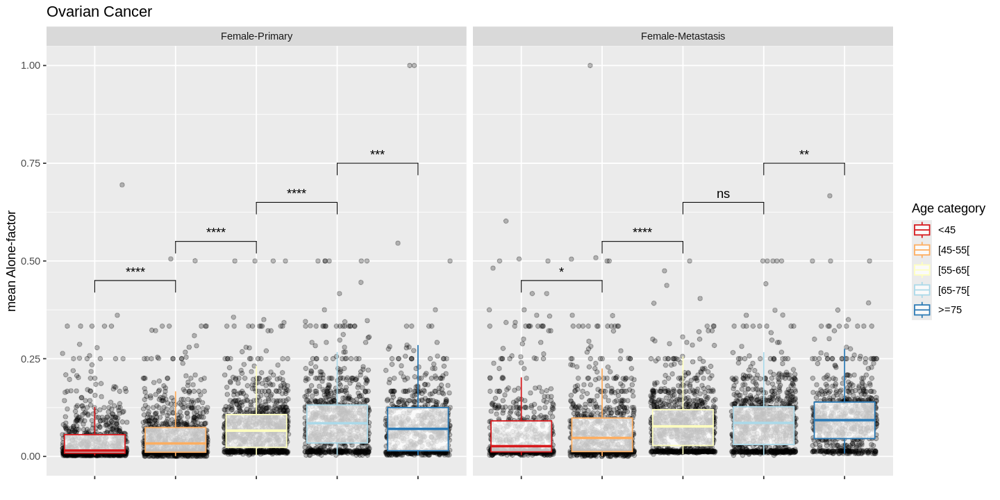

Warning message:
“Removed 13 rows containing missing values or values outside the scale range (`geom_point()`).”


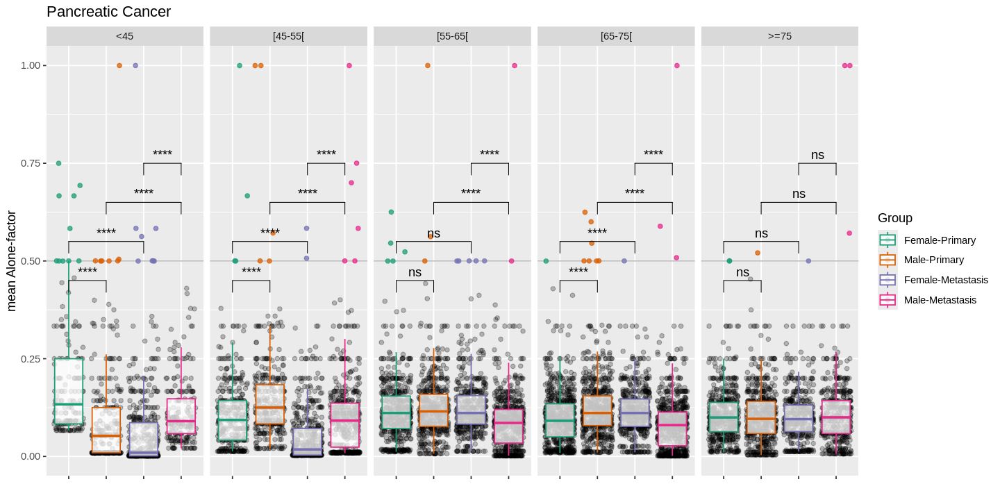

Warning message:
“Removed 10 rows containing missing values or values outside the scale range (`geom_point()`).”


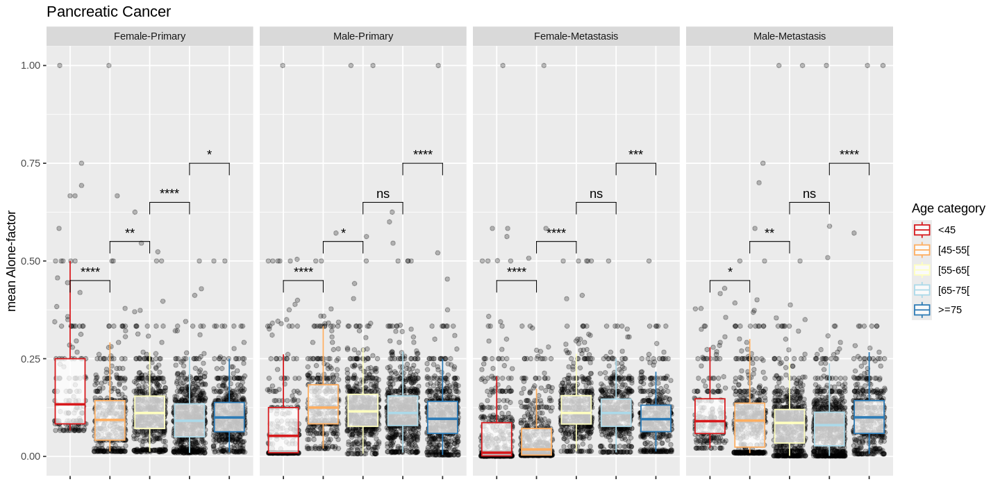

Warning message:
“Removed 13 rows containing missing values or values outside the scale range (`geom_point()`).”


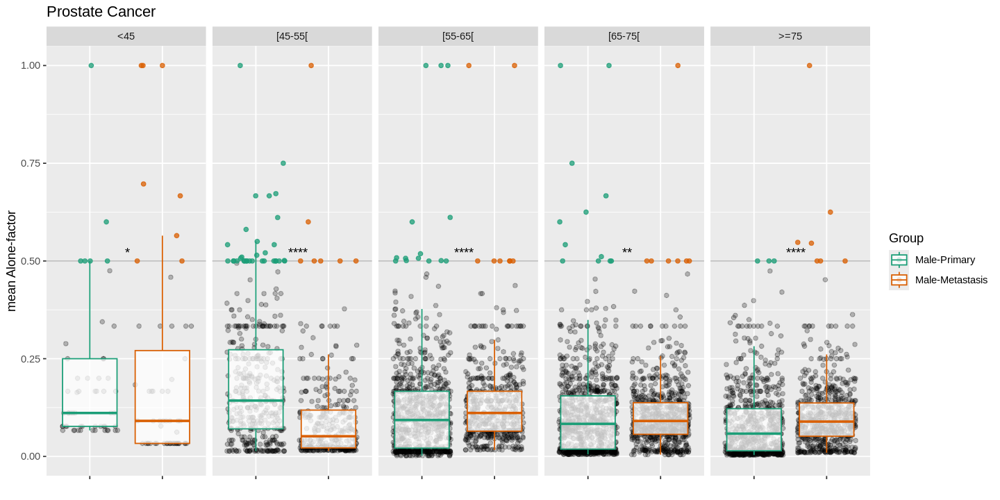

Warning message:
“Removed 18 rows containing missing values or values outside the scale range (`geom_point()`).”


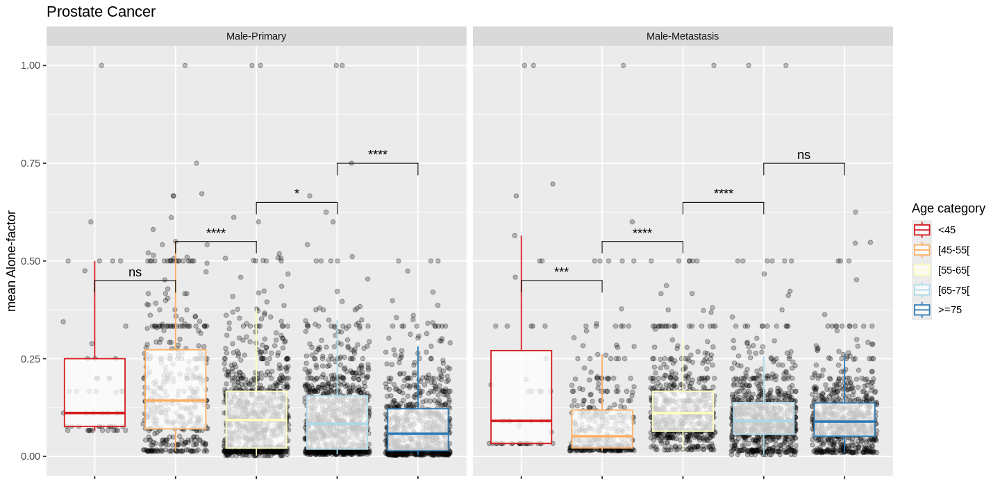

Warning message:
“Removed 17 rows containing missing values or values outside the scale range (`geom_point()`).”


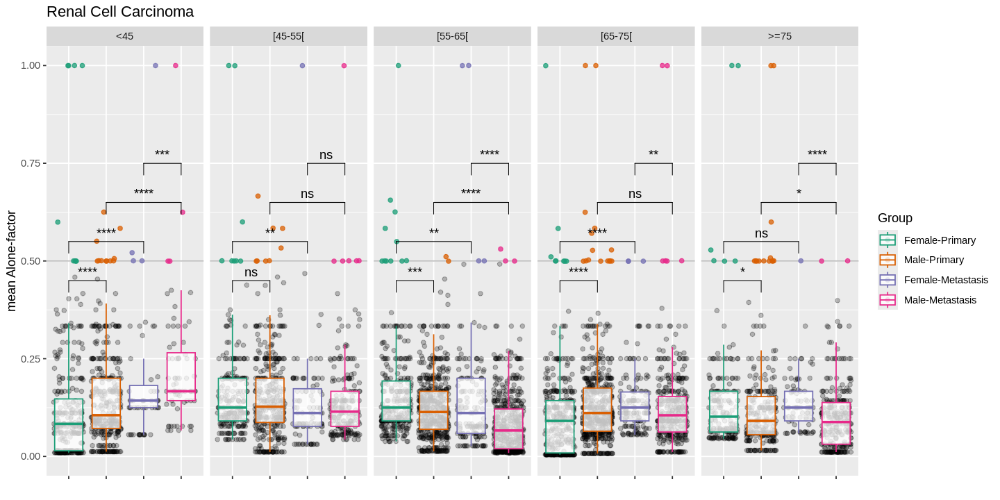

Warning message:
“Removed 47 rows containing missing values or values outside the scale range (`geom_point()`).”


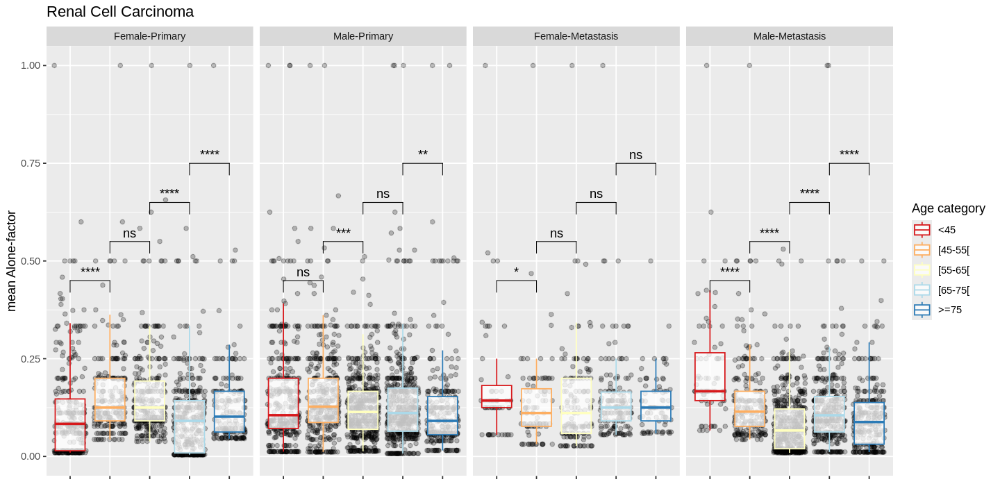

Warning message:
“Removed 55 rows containing missing values or values outside the scale range (`geom_point()`).”


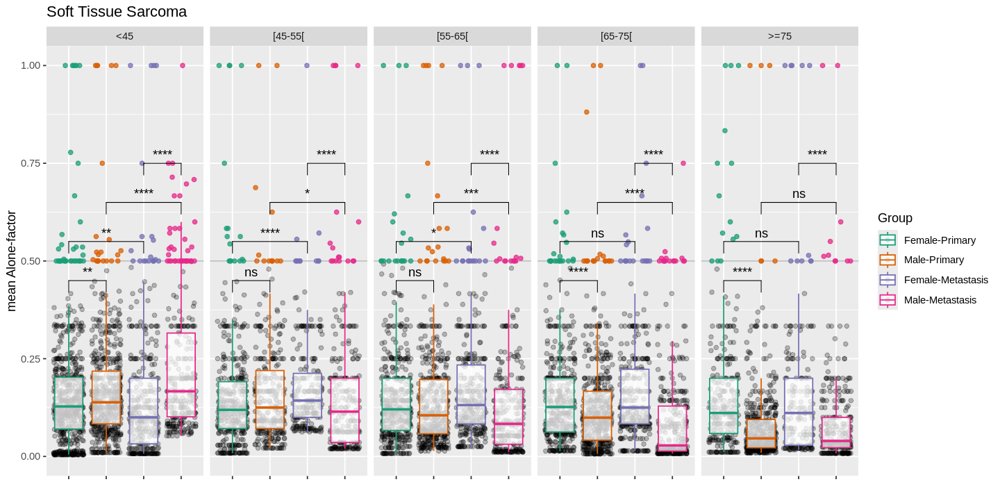

Warning message:
“Removed 12 rows containing missing values or values outside the scale range (`geom_point()`).”


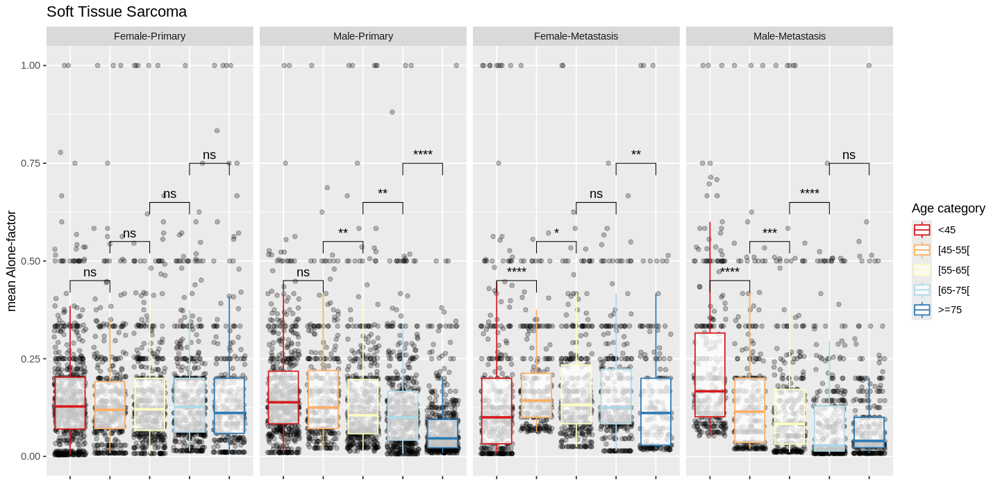

Warning message:
“Removed 14 rows containing missing values or values outside the scale range (`geom_point()`).”


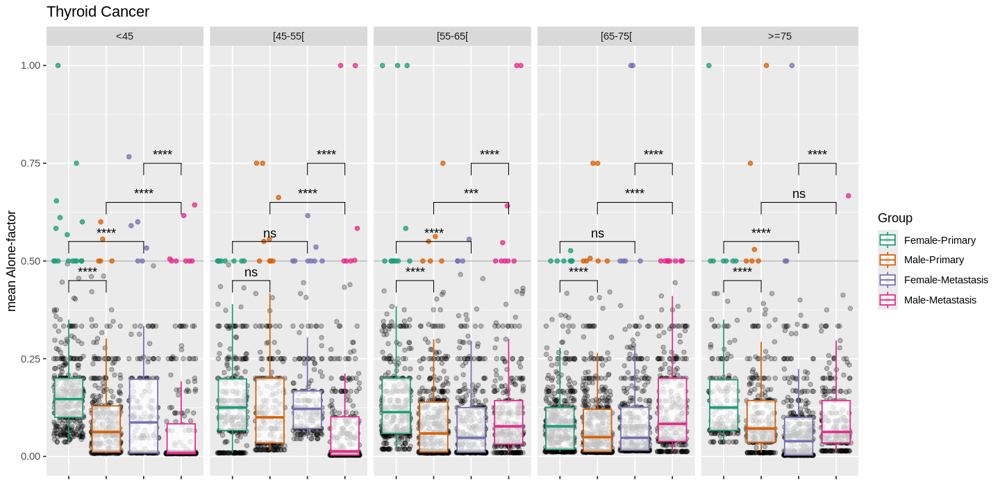

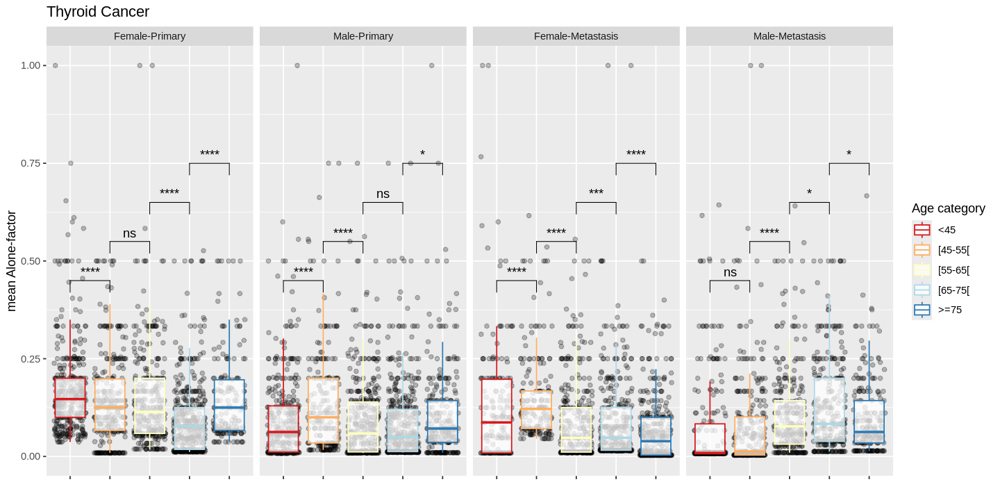

In [19]:
# Suppress summarise info
options(dplyr.summarise.inform = FALSE)
# Change plot size
options(repr.plot.width=12, repr.plot.height=6)
# Age-interval factor levels
cancer_specific_alone_factor$age_interval <- factor(cancer_specific_alone_factor$age_interval, levels=age_interval_levels)

for (cancer in unique(cancer_specific_alone_factor$cancer_type)){
    
    dat <- cancer_specific_alone_factor[which(cancer_specific_alone_factor$cancer_type==cancer),]
    
    mean <- dat %>% group_by(cancer_type, age_interval, group, Hugo_Symbol) %>% summarize(m = mean(alone_factor))
    
    mean <- na.omit(mean)

    under_50 <- mean[which(mean$m < 0.5),]
    above_50 <- mean[which(mean$m >= 0.5),]
    
    if (cancer == 'Endometrial Cancer' | cancer == 'Ovarian Cancer' | cancer == 'Prostate Cancer'){
        
        q1 <- ggplot(mean, aes(x = group, y = m)) +
        geom_hline(yintercept=0.5, color='grey') +
        geom_jitter(data=under_50, alpha=0.25) +
        geom_jitter(data=above_50, alpha=0.75, aes(group=group, colour=group)) +
        geom_boxplot(alpha=0.75, outlier.shape=NA, aes(group=group, colour=group)) +
        stat_compare_means(aes(label = after_stat(p.signif)), label.y = 0.51, label.x=1.5) +
        scale_color_brewer(palette = "Dark2") +
        labs(title = cancer) +
        facet_wrap(~age_interval, nrow=1) +
        ylim(0, 1) +
        xlab('') +
        ylab('mean Alone-factor') +
        labs(colour='Group') +
        theme(axis.text.x=element_blank())  
    }else {
        my_comparisons1 <- list( c("Female-Primary", "Male-Primary"), c("Female-Primary", "Female-Metastasis"), c("Male-Primary", "Male-Metastasis"), c("Male-Metastasis", "Female-Metastasis"))

        q1 <- ggplot(mean, aes(x = group, y = m)) +
        geom_hline(yintercept=0.5, color='grey') +
        geom_jitter(data=under_50, alpha=0.25) +
        geom_jitter(data=above_50, alpha=0.75, aes(group=group, colour=group)) +
        geom_boxplot(alpha=0.75, outlier.shape=NA, aes(group=group, colour=group)) +
        stat_compare_means(comparisons = my_comparisons1, label.y = c(0.4, 0.5, 0.6, 0.7), aes(label = after_stat(p.signif))) +
        scale_color_brewer(palette = "Dark2") +
        labs(title = cancer) +
        facet_wrap(~age_interval, nrow=1) +
        ylim(0, 1) +
        xlab('') +
        ylab('mean Alone-factor') +
        labs(colour='Group') +
        theme(axis.text.x=element_blank())
    }
    
    my_comparisons2 <- list( c("<45", "[45-55["), c("[45-55[", "[55-65["), c("[55-65[", "[65-75["), c("[65-75[", ">=75"))
    
    q2 <- ggplot(mean, aes(x = age_interval, y = m)) +
    geom_jitter(alpha=0.25) +
    geom_boxplot(alpha=0.75, outlier.shape=NA, aes(group=age_interval, colour=age_interval)) +
    stat_compare_means(comparisons = my_comparisons2, label.y = c(0.4, 0.5, 0.6, 0.7), aes(label = after_stat(p.signif))) +
    scale_color_brewer(palette = "RdYlBu") +
    labs(title = cancer) +
    facet_wrap(~group, nrow=1) +
    ylim(0, 1) +
    xlab('') +
    ylab('mean Alone-factor') +
    labs(colour='Age category') +
    theme(axis.text.x=element_blank())
    
    # Note: list(cutpoints = c(0, 0.0001, 0.001, 0.01, 0.05, Inf), symbols = c("****", "***", "**", "*", "ns")) 
    
    print(q1)
    print(q2)
}

In [20]:
fwrite(cancer_specific_alone_factor, "../../derived_data/genie_v15/cs_alone_factor.csv")
fwrite(mean, "../../derived_data/genie_v15/cs_alone_factor_mean.csv")